<a href="https://colab.research.google.com/github/Abhivandhana/CV/blob/main/Basics1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [32]:
# import the necessary packages
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import argparse
import cv2
import numpy as np
from google.colab import files
uploaded = files.upload()

Saving fruits.jpg to fruits.jpg


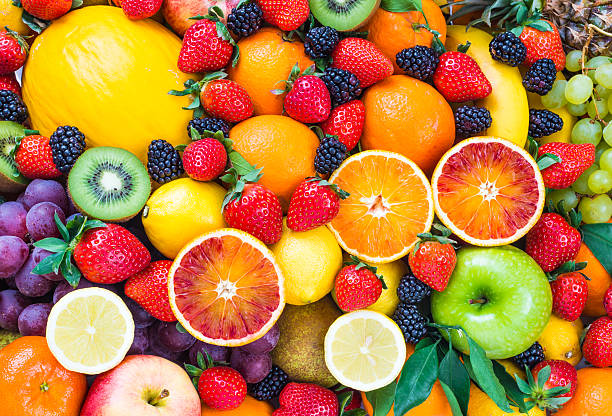

height: 416 pixels
width: 612 pixels
channels: 3
Pixel at (10, 200) - Red: 250, Green: 132, Blue: 118


In [33]:
# load the image from file location address and show basic information of it
img = cv2.imread("fruits.jpg")
cv2_imshow(img)
print("height: {} pixels".format(img.shape[0]))
print("width: {} pixels".format(img.shape[1]))
print("channels: {}".format(img.shape[2]))
# images are just NumPy arrays. The top-left pixel can be found at (0, 0)
(b, g, r) = img[10, 200]
print ("Pixel at (10, 200) - Red: {red}, Green: {green}, Blue: {blue}".format(red=r, green=g, blue=b))

Pixel at (10, 200) - Red: 255, Green: 0, Blue: 0


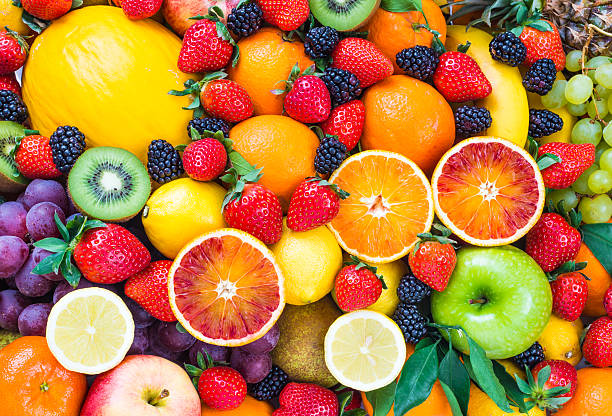

In [34]:
# now, let's change the value of the pixel at (70, 200) and make it white
img[10, 200] = (0, 0, 255)
(b, g, r) = img[10, 200]
print ("Pixel at (10, 200) - Red: {red}, Green: {green}, Blue: {blue}".format(red=r, green=g, blue=b))
cv2_imshow(img)


R


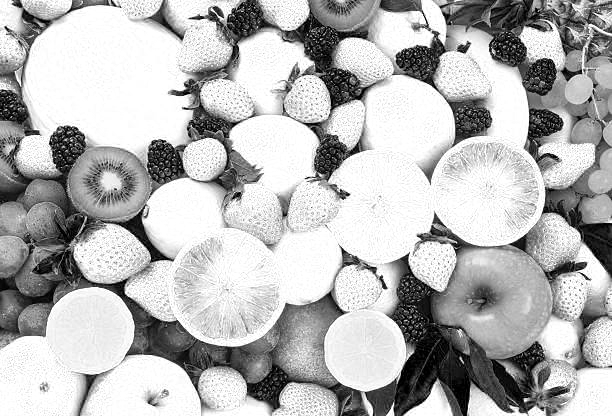



G


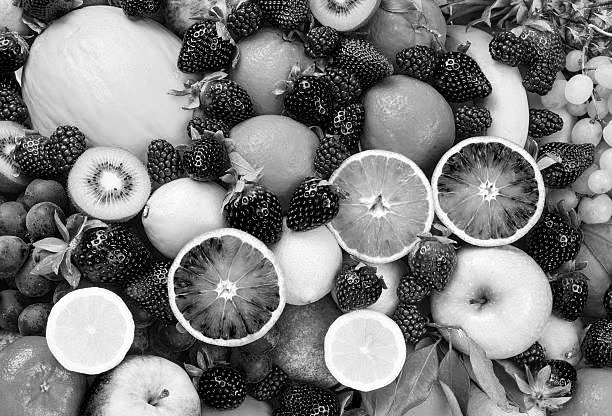



B


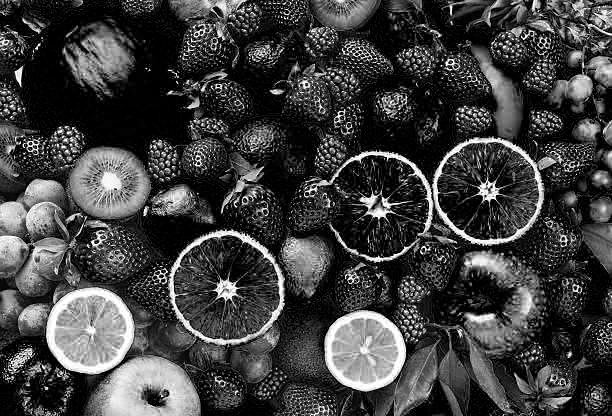

In [35]:
# Grab each channel: Red, Green, and Blue
# OpenCV stores an image as NumPy array with its channels in reverse order
# cv2.split - actually getting the channels as Blue, Green, Red
(B, G, R) = cv2.split(img)

# show each channel individually
print("R")
cv2_imshow(R)
print('\n')
print("G")
cv2_imshow(G)
print('\n')
print("B")
cv2_imshow(B)


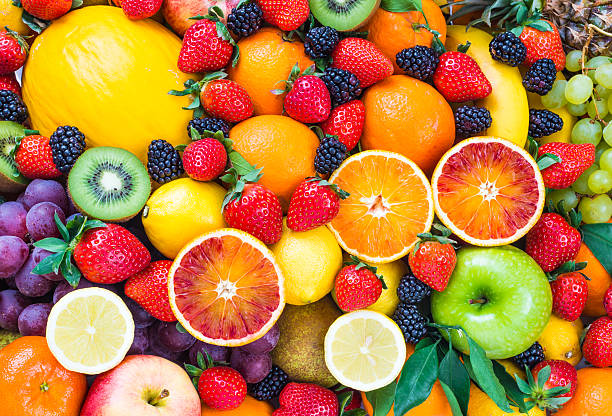

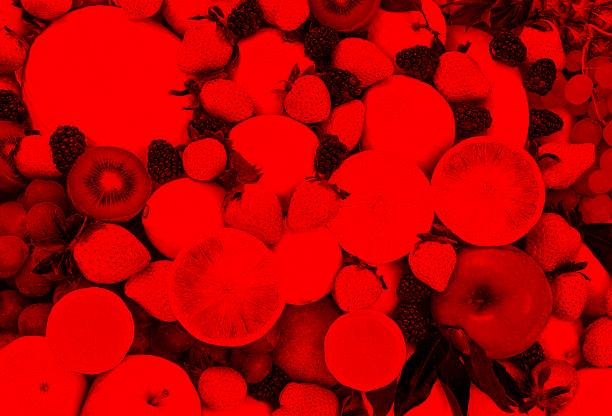

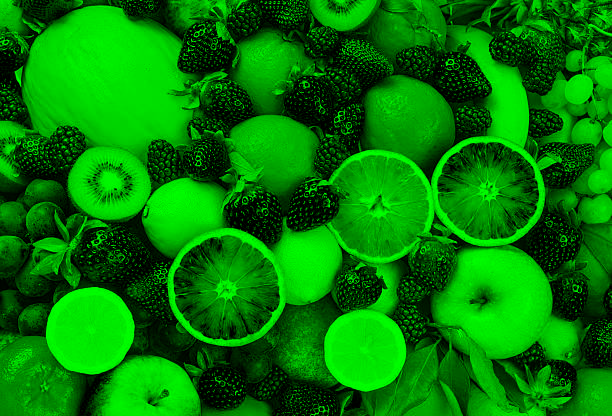

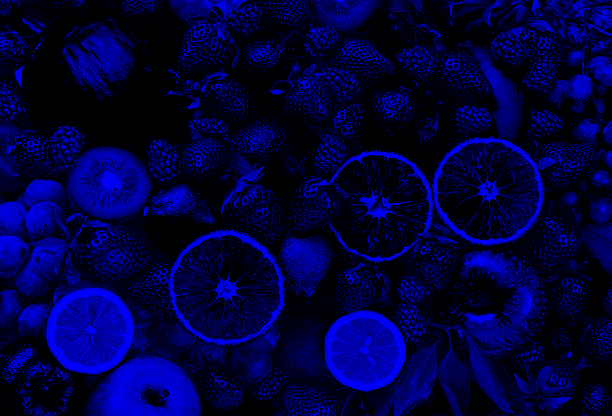

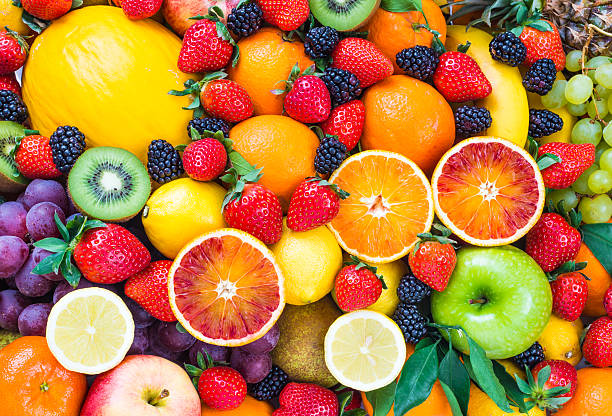

...

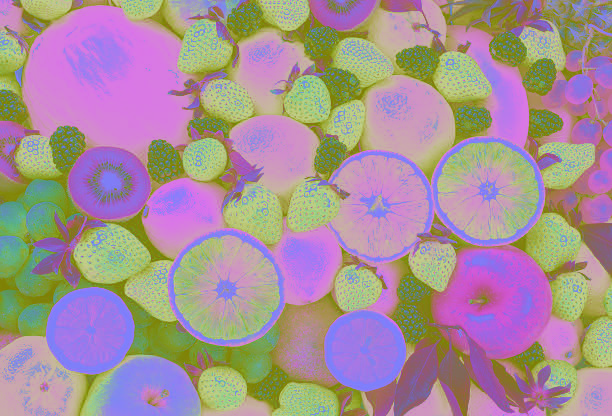

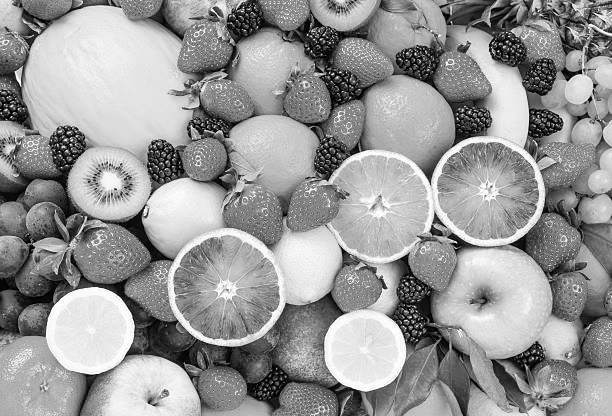

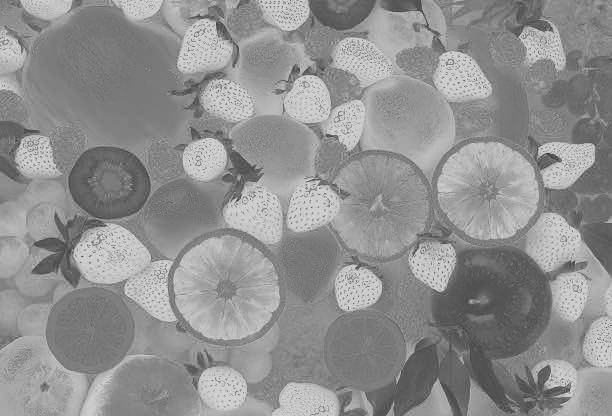

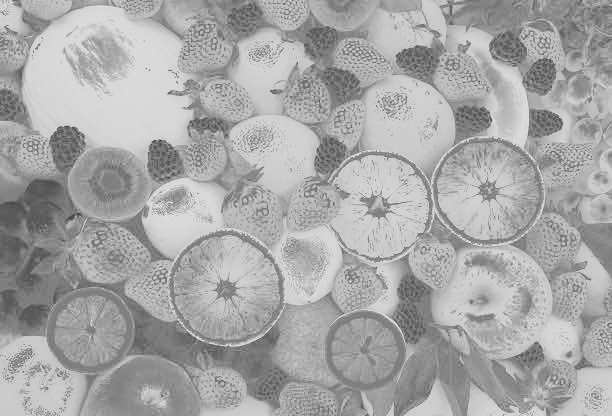

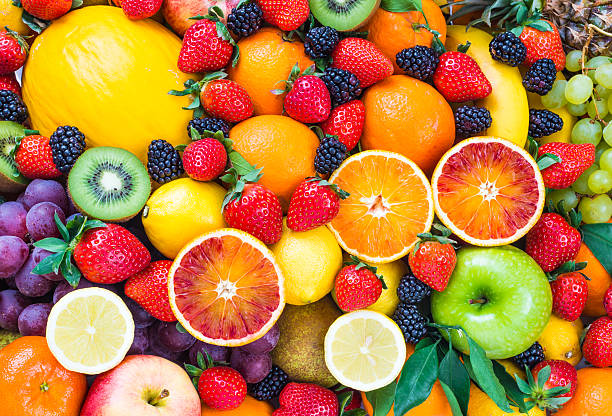

In [36]:
# merge the image back together again
merged = cv2.merge([B, G, R])
cv2_imshow(merged)
# visualize each channel in color
zeros = np.zeros(img.shape[:2], dtype = "uint8")
cv2_imshow(cv2.merge([zeros, zeros, R]))
print("\n")
cv2_imshow(cv2.merge([zeros, G, zeros]))
print("\n")
cv2_imshow(cv2.merge([B, zeros, zeros]))
print("\n")
# Color space conversion
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(img)
print("\n")
cv2_imshow(gray)
# convert the image to the HSV color space and show it
# specify the cv2.COLOR_BGR2HSV flag to indicate that we want to convert from BGR to HSV.
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
cv2_imshow(hsv)
print("\n")

# loop over each of the individual channels and display them
for (name, chan) in zip(("H", "S", "V"), cv2.split(hsv)):
	cv2_imshow(chan)
	print("\n")
# convert the image to the L*a*b* color space and show it
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
cv2_imshow(lab)
print("\n")
# loop over each of the individual channels and display them
for (name, chan) in zip(("L*", "a*", "b*"), cv2.split(lab)):
	cv2_imshow(chan)
	print("\n")
(h, w) = img.shape[:2]
cv2_imshow(img)
print("\n")


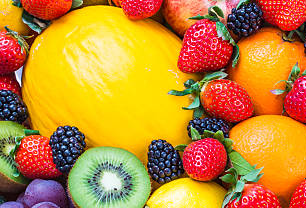

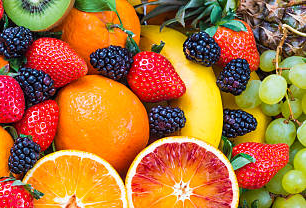

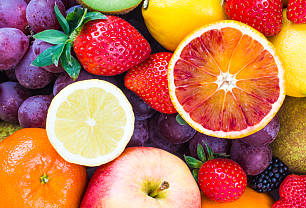

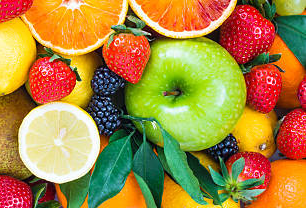

In [37]:
# compute the center of the image, which is simply the width and height divided by two
(cX, cY) = (int(w / 2),int(h/2))

# since we are using NumPy arrays, we can apply slicing and grab large chunks in image
tl = img[0:cY, 0:cX]
tr = img[0:cY, cX:w]
bl = img[cY:h, 0:cX]
br = img[cY:h, cX:w]
cv2_imshow(tl)
print("\n")
cv2_imshow(tr)
print("\n")
cv2_imshow(bl)
print("\n")
cv2_imshow(br)
print("\n")

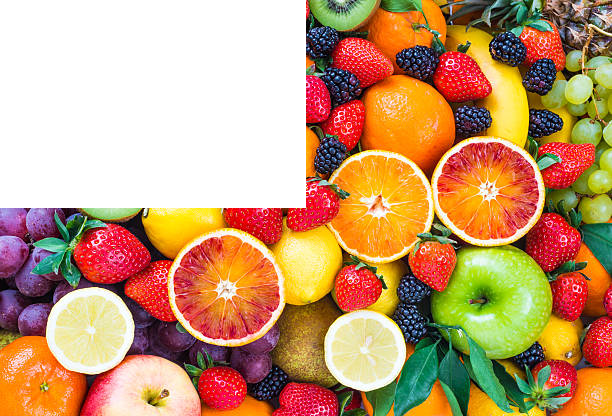

(0.0, 3000.0)

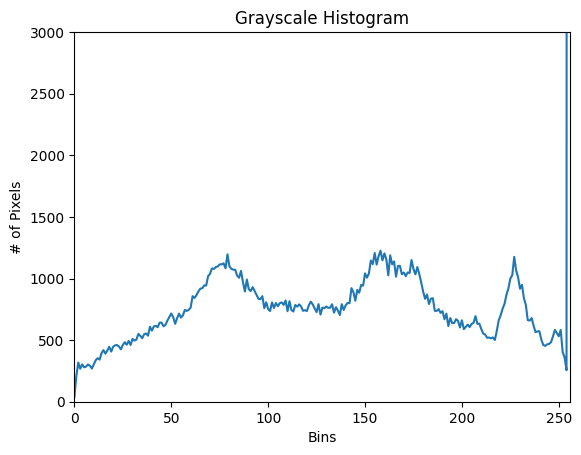

In [50]:

# now let's make the top-left corner of the original image white
img[0:cY, 0:cX] = (255, 255, 255)
cv2_imshow(img)
# construct a grayscale histogram
# A grayscale image has only one channel, so we have a value of [0] for channels .
# We don’t have a mask, so we set the mask value to None.
# We will use 256 bins in our histogram, and the possible values range from 0 to 255.
# image = cv2.imread( "apj.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
hist = cv2.calcHist([gray], [0], None, [256], [0, 256])

# plot the histogram
plt.figure()
plt.title("Grayscale Histogram")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")
plt.plot(hist)
plt.xlim([0, 256])
plt.ylim([0, 3000])


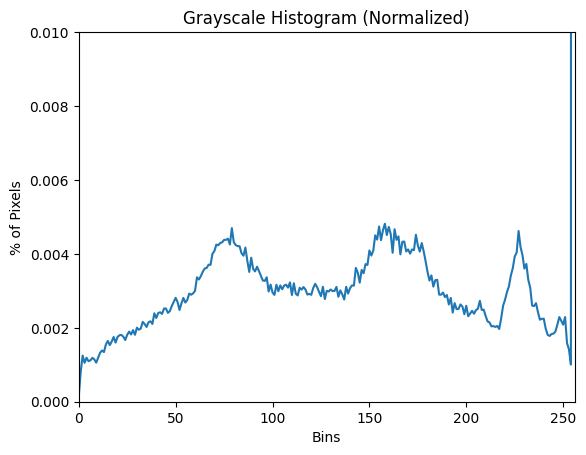

In [42]:
# normalize the histogram, simply dividing the raw frequency counts for each bin of the
# histogram by the sum of the counts, this leaves us with the percentage of each bin rather than
# the raw count of each bin.
hist /= hist.sum()

# plot the normalized histogram
plt.figure()
plt.title("Grayscale Histogram (Normalized)")
plt.xlabel("Bins")
plt.ylabel("% of Pixels")
plt.plot(hist)
plt.xlim([0, 256])
plt.ylim([0, 0.01])
plt.show()


Text(0, 0.5, '# of Pixels')

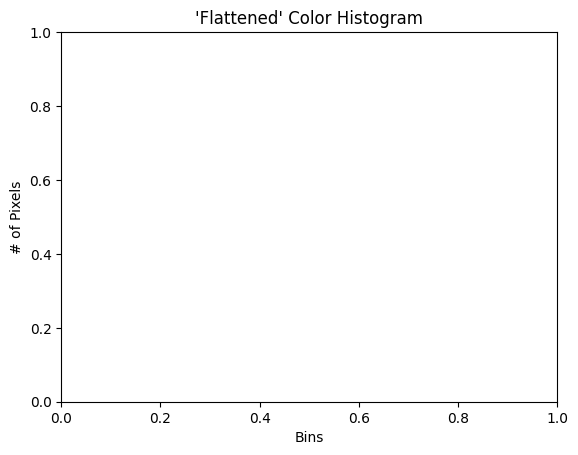

In [40]:
# grab the image channels, initialize the tuple of colors and the figure
chans = cv2.split(img)
colors = ("b", "g", "r")
plt.figure()
plt.title("'Flattened' Color Histogram")
plt.xlabel("Bins")
plt.ylabel("# of Pixels")

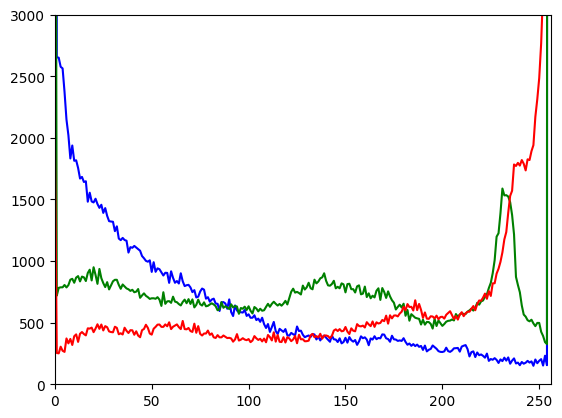

In [49]:
# loop over the image channels
# we start looping over each of the channels in the image.
# Then, for each channel we compute a histogram
for (chan, color) in zip(chans, colors):
	# create a histogram for the current channel and plot it
	hist = cv2.calcHist([chan], [0], None, [256], [0, 256
	                                               ])
	plt.plot(hist, color = color)
	plt.xlim([0,256])
	plt.ylim([0,3000])
# Show our plots
plt.show()